In [2]:
##Importamos Librerías para manejar los ficheros y librerías de Tensorflow y Keras

import os
import itertools

import tensorflow as tf
import keras
from tensorflow import keras
from keras._tf_keras.keras.optimizers import Adam,Adam
from keras_preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, BatchNormalization

from tensorflow.keras import Sequential
from tensorflow.python.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras._tf_keras.keras.applications import EfficientNetB3

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

Una vez importadas las librerías (A priori no necesitamos nada más), tenemos que separar el dataset y prepararlo, de forma que etitquetamos aquellos datos que son para training correctamente.

In [3]:
def separar_datos(): ##Path hardcodeado = /content/drive/Mydrive/TFG
  imgpaths,labels = [],[] ## 2 listas para almacenar los paths a las imagenes y las etiquetas
  path = r"C:\Users\Pablo\Desktop\TFG\DATA"
  subfolders = os.listdir(path)
  for subfolder in subfolders:
    bodypartpath=os.path.join(path,subfolder)
    bodyparts=os.listdir(bodypartpath)
    for bodypart in bodyparts:
      typepath=os.path.join(bodypartpath,bodypart)
      print(typepath)
      imgs=os.listdir(typepath)
      for img in imgs:
        imgpath=os.path.join(typepath,img)
        if ")" not in imgpath: ##Drive la lio subiendo archivos duplicados y desde drive no pueden borrarse de forma cómoda así que filtro los espacios para evitar aquellos que son del estilo img (1).jpg
          imgpaths.append(imgpath)
          print(imgpath)
          labels.append(bodypart)
  ##Metemos en un Dataframe de pandas para luego hacer el split mas sencillo
  dataframe= pd.DataFrame(data={'imgpath':imgpaths,'label':labels})
  return dataframe

Separamos los datos y verificamos que el reparto por etiquetas es equitativo.

In [4]:
dataframe=separar_datos()
dataframe['label'].value_counts()

C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca10.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca100.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1000.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1001.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1002.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1003.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1004.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1005.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1006.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1007.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\colon_image_sets\colon_aca\colonca1008.jpeg
C:\Users\Pablo\Desktop\TFG\DATA\col

label
lung_scc     5001
colon_aca    5000
colon_n      5000
lung_aca     5000
lung_n       5000
Name: count, dtype: int64

Una vez el dataset esta clasificado correctamente lo que debemos hacer es separarlo en TRAINING/VALIDACION/TESTING.

In [5]:
##Hacemos el primer split en Training/Aux --> Ese dataset Aux lo volvemos a splitear en 2 para obtener validacion y testing.
train_df, aux_df = train_test_split(dataframe, test_size=0.3, random_state=42, stratify=dataframe['label'])
valid_df, test_df = train_test_split(aux_df, test_size=0.5, random_state=42, stratify=aux_df['label'])

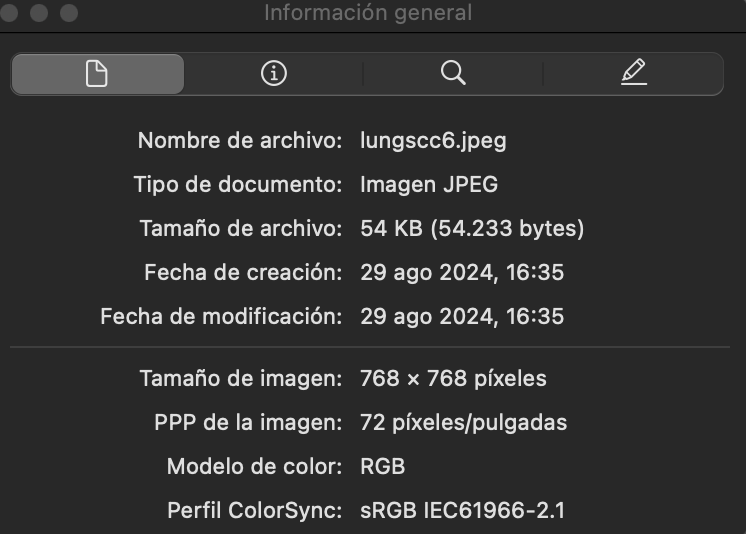

Las imágenes las vamos a normalizar y reescalar, de forma que el procesamiento de las mismas sea mas agil. Usando ImageDataGenerator vamos a normalizar la imagen de forma que los valores mas cercanos a 255 (Valor máximo RGB) pasarán a ser 1. y aquellos mas cercanos al 0 (valor minimo rgb) pasarán a ser 0

In [6]:
data_gen= ImageDataGenerator(rescale=1./255)
##además de normalizarlas se reducen de tamaño cuando se procesan con flowfromdataframe

Vamos a generar ahora los lotes a partir del dataframe, como ya hemos creado el ImageDataGenerator, ahora usamos la función de esta clase llamada flow_from_dataframe. Los parametros utilizados van a aplicar una reduccion hastas 300x300 pixeles, además se va a usar Shuffle en los sets de training y validacion para evitar que la CNN ajuste mal los pesos al repetir patrones.

In [7]:
training_gen=data_gen.flow_from_dataframe(train_df,x_col='imgpath',y_col='label',target_size=(224,224),color_mode='rgb',class_mode='categorical',batch_size=32,shuffle=True)

Found 17500 validated image filenames belonging to 5 classes.


In [8]:
valid_gen=data_gen.flow_from_dataframe(valid_df,x_col='imgpath',y_col='label',target_size=(224,224),color_mode='rgb',class_mode='categorical',batch_size=32,shuffle=True)

Found 3750 validated image filenames belonging to 5 classes.


In [9]:
testing_gen=data_gen.flow_from_dataframe(test_df,x_col='imgpath',y_col='label',target_size=(224,224),color_mode='rgb',class_mode='categorical',batch_size=32,shuffle=False)

Found 3750 validated image filenames belonging to 5 classes.


c:\Users\Pablo\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras_preprocessing\image\dataframe_iterator.py:279: UserWarning: Found 1 invalid image filename(s) in x_col="imgpath". These filename(s) will be ignored.
  warnings.warn(


Lo siguiente que voy a hacer es plantear los modelos, voy a plantear 2, con ciertas diferencias, para poder hablar un poco de distintas cosas, uno lo vamos a plantear de 0, mientras que en otro vamos a usar transfer learning y lo vamos a adaptar.


In [10]:
model1 = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Conv2D(16, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Conv2D(16, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),

    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(5, activation='softmax')  # Cambia a 'softmax' para más de 2 clases
])
model1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model1.summary()


c:\Users\Pablo\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 111, 111, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 54, 54, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 26, 26, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 16)     │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 12, 12, 16)     │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 672,325 (2.56 MB)

 Trainable params: 672,133 (2.56 MB)

 Non-trainable params: 192 (768.00 B)

In [37]:
epocas = 20
call_back1 = EarlyStopping(monitor='val_accuracy', restore_best_weights=True, patience=5, verbose=0)
history1 = model1.fit(training_gen, epochs=epocas, callbacks=call_back1, validation_data=valid_gen, verbose=1)

Epoch 1/20


c:\Users\Pablo\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


547/547 ━━━━━━━━━━━━━━━━━━━━ 268s 482ms/step - accuracy: 0.7446 - loss: 0.2751 - val_accuracy: 0.6640 - val_loss: 0.9131
Epoch 2/20
547/547 ━━━━━━━━━━━━━━━━━━━━ 175s 318ms/step - accuracy: 0.9106 - loss: 0.0997 - val_accuracy: 0.4469 - val_loss: 2.8888
Epoch 3/20
547/547 ━━━━━━━━━━━━━━━━━━━━ 173s 315ms/step - accuracy: 0.9318 - loss: 0.0774 - val_accuracy: 0.8483 - val_loss: 0.1867
Epoch 4/20
547/547 ━━━━━━━━━━━━━━━━━━━━ 173s 315ms/step - accuracy: 0.9502 - loss: 0.0559 - val_accuracy: 0.9464 - val_loss: 0.0547
Epoch 5/20
547/547 ━━━━━━━━━━━━━━━━━━━━ 169s 307ms/step - accuracy: 0.9558 - loss: 0.0499 - val_accuracy: 0.9467 - val_loss: 0.0502
Epoch 6/20
547/547 ━━━━━━━━━━━━━━━━━━━━ 161s 294ms/step - accuracy: 0.9623 - loss: 0.0406 - val_accuracy: 0.9547 - val_loss: 0.0516
Epoch 7/20
547/547 ━━━━━━━━━━━━━━━━━━━━ 161s 293ms/step - accuracy: 0.9694 - loss: 0.0373 - val_accuracy: 0.7165 - val_loss: 0.3821
Epoch 8/20
547/547 ━━━━━━━━━━━━━━━━━━━━ 161s 293ms/step - accuracy: 0.9733 - loss: 0.03

In [38]:
def plot_accuracy(history):
    training_accuracy=history.history['accuracy']
    validation_accuracy=history.history['val_accuracy']
    index_accuracy=np.argmax(validation_accuracy)
    validation_highest=validation_accuracy[index_accuracy]
    nepocas=[i+1 for i in range(len(training_accuracy))]
    labelBest=f'best epoch={str(index_accuracy+1)}'
    plt.figure(figsize=(7,2))
    plt.style.use('fivethirtyeight')
    plt.plot(nepocas,training_accuracy,'r',label='Accuracy durante el training')
    plt.plot(nepocas,validation_accuracy,'g',label='Accuracy durante la validacion')
    plt.scatter(index_accuracy+1,validation_highest,s=150,c='black',label=labelBest)
    plt.title('Precisión durante el training y validación')
    plt.xlabel('Epocas')
    plt.ylabel('Precision')
    plt.legend()
    plt.tight_layout
    plt.show()

def plot_loss(history):
    training_loss=history.history['loss']
    validation_loss=history.history['val_loss']
    index_loss=np.argmin(validation_loss)
    validation_lowest=validation_loss[index_loss]
    nepocas=[i+1 for i in range(len(training_loss))]
    labelBest=f'best epoch={str(index_loss+1)}'
    plt.figure(figsize=(7,2))
    plt.style.use('fivethirtyeight')
    plt.plot(nepocas,training_loss,'r',label='Pérdida durante el training')
    plt.plot(nepocas,validation_loss,'g',label='Pérdida durante la validación')
    plt.scatter(index_loss+1,validation_lowest,s=150,c='black',label=labelBest)
    plt.title('Pérdida durante el training y validación')
    plt.xlabel('Epocas')
    plt.ylabel('Pérdida')
    plt.legend()
    plt.tight_layout
    plt.show()

def plot_both(history):
    plot_accuracy(history)
    plot_loss(history)

Una vez entrenado el modelo hemos definido funciones, estas simplemente sirven para mostrar los resultados arrojados durante el training de una manera mas visual.

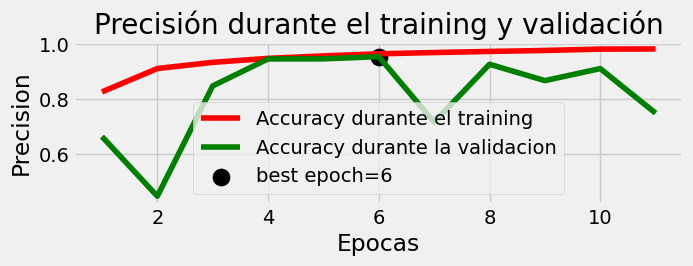

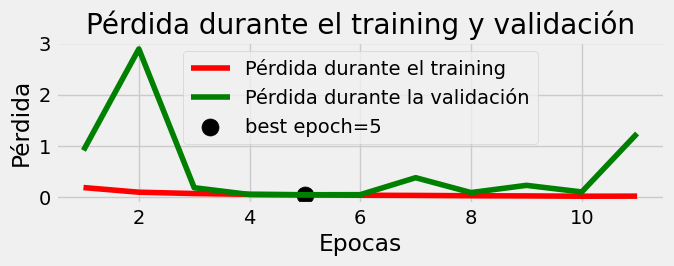

In [39]:
plot_both(history1)

Ahora es hora de poner a prueba nuestro modelo con los 3 datasets que tenemos para observar la precisión real

In [40]:
evaluate_training=model1.evaluate(training_gen)
training_loss=evaluate_training[0]
trainining_accuracy=evaluate_training[1]

evaluate_validation=model1.evaluate(valid_gen)
validation_loss=evaluate_validation[0]
validation_accuracy=evaluate_validation[1]

evaluate_testing=model1.evaluate(testing_gen)
testing_loss=evaluate_testing[0]
testing_accuracy=evaluate_testing[1]
model1.save('./modelo1.h5')

547/547 ━━━━━━━━━━━━━━━━━━━━ 70s 128ms/step - accuracy: 0.9701 - loss: 0.0345
118/118 ━━━━━━━━━━━━━━━━━━━━ 15s 127ms/step - accuracy: 0.9541 - loss: 0.0530
  1/118 ━━━━━━━━━━━━━━━━━━━━ 19s 167ms/step - accuracy: 0.9375 - loss: 0.0508

c:\Users\Pablo\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


118/118 ━━━━━━━━━━━━━━━━━━━━ 32s 268ms/step - accuracy: 0.9484 - loss: 0.0606


En mi caso, en esta primera parte de desarrollo, voy a generar un modelo usando ResNet50, para ver las diferencias de resultados entre el modelo propuesto y un modelo empleando transferlearning.

In [41]:
# Cargar el modelo preentrenado sin las capas superiores (sin la capa fully connected)
from tensorflow.keras.applications import ResNet50,EfficientNetB0
from tensorflow.keras import layers,models
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Congelar las capas del modelo base para no entrenarlas
base_model.trainable = False

Epoch 1/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 662s 1s/step - accuracy: 0.3614 - loss: 1.5064 - val_accuracy: 0.5544 - val_loss: 1.0653
Epoch 2/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 680s 1s/step - accuracy: 0.5236 - loss: 1.0890 - val_accuracy: 0.5795 - val_loss: 0.9568
Epoch 3/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 628s 1s/step - accuracy: 0.5756 - loss: 0.9901 - val_accuracy: 0.6280 - val_loss: 0.8713
Epoch 4/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 609s 1s/step - accuracy: 0.5994 - loss: 0.9392 - val_accuracy: 0.6293 - val_loss: 0.8813
Epoch 5/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 637s 1s/step - accuracy: 0.6304 - loss: 0.8925 - val_accuracy: 0.6816 - val_loss: 0.7865
Epoch 6/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 620s 1s/step - accuracy: 0.6518 - loss: 0.8519 - val_accuracy: 0.7112 - val_loss: 0.7367
Epoch 7/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 607s 1s/step - accuracy: 0.6587 - loss: 0.8206 - val_accuracy: 0.7125 - val_loss: 0.7297
Epoch 8/10
547/547 ━━━━━━━━━━━━━━━━━━━━ 591s 1s/step - accuracy: 0.6575 - loss: 0.8204 - val_accu

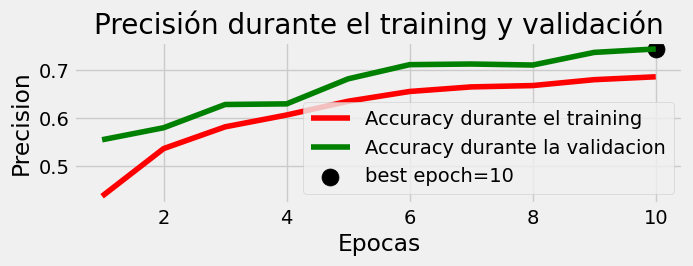

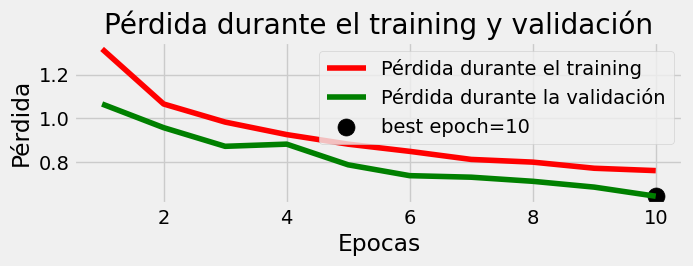

In [42]:
# Crear el modelo de transferencia con capas personalizadas
model2 = models.Sequential()

# Añadir el modelo base
model2.add(base_model)

# Añadir un Pooling Global para reducir la dimensionalidad
model2.add(layers.GlobalAveragePooling2D())

# Añadir la capa fully connected
model2.add(layers.Dense(512, activation='relu'))
model2.add(layers.Dropout(0.5))  # Añadir dropout para prevenir overfitting

# Añadir la capa de salida con tantas neuronas como clases tengas (cambiar softmax si es binario)
model2.add(layers.Dense(5, activation='softmax'))

# Compilar el modelo
model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Entrenamiento del modelo
history2 = model2.fit(training_gen,
                    epochs=10,  # Puedes aumentar los epochs según lo necesites
                    validation_data=valid_gen)

plot_both(history2)


Testeamos ahora el modelo 2.

In [43]:
evaluate_training2=model2.evaluate(training_gen)
training_loss2=evaluate_training2[0]
trainining_accuracy2=evaluate_training2[1]

evaluate_validation2=model2.evaluate(valid_gen)
validation_loss2=evaluate_validation2[0]
validation_accuracy2=evaluate_validation2[1]

evaluate_testing2=model2.evaluate(testing_gen)
testing_loss2=evaluate_testing2[0]
testing_accuracy2=evaluate_testing2[1]
model2.save('./modelo2.h5')

547/547 ━━━━━━━━━━━━━━━━━━━━ 495s 905ms/step - accuracy: 0.7545 - loss: 0.6194
118/118 ━━━━━━━━━━━━━━━━━━━━ 112s 946ms/step - accuracy: 0.7215 - loss: 0.6547
118/118 ━━━━━━━━━━━━━━━━━━━━ 114s 968ms/step - accuracy: 0.7362 - loss: 0.6365


In [46]:
##Reguardar en formato TF
model1.save('./modelo1tf.keras')
model2.save('./modelo2tf.keras')

En Nuestro caso vemos que se arrojan resultados mucho mejores  cuando empleamos el modelo 1, lo que nos sugiere que el transfer learning, al menos usando el modelo ResNet50, no es tan práctico para el caso que estamos tratando.

Una vez hemos aprendido un poco el proceso de crear los modelos,los hemos guardado y vamos a meternos de lleno con el uso de Foolbox.

FoolBox se define como una librería de python que permite ejecutar de manera rápida ataques sobre modelos de machine learning con el objetivo de testear la robustez de los mismos.
En mi caso, veo que los resultados de mi modelo 1 son buenos, pero surge la duda de si el modelo será robusto ante distintos ataques que puede sufrir.
Será el modelo 2, generado con transfer learning, menos preciso pero más robusto que nuestro modelo 1?

In [10]:
from tensorflow.keras.models import load_model

In [11]:
##Para no modificar nuestros modelos lo que vamos a hacer es simplemente generar 2 nuevos cargando los que ya teníamos para trabajar sobre ellos.
modelo1_attack = load_model('./modelo1tf.keras')
modelo2_attack = load_model('./modelo2tf.keras')

c:\Users\Pablo\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\saving\saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 24 variables whereas the saved optimizer has 46 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
c:\Users\Pablo\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\saving\saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 6 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


A estos modelos les tenemos que añadir el wrapper de Foolbox para poder trabajar sobre ellos. Primero vamos a ver como afectaría un ataque FGSM

[4 0 0 2 2 0 2 3 1 3 1 0 4 4 1 3 4 1 1 3 2 1 4 3 2 2 1 3 2 2 0 2]


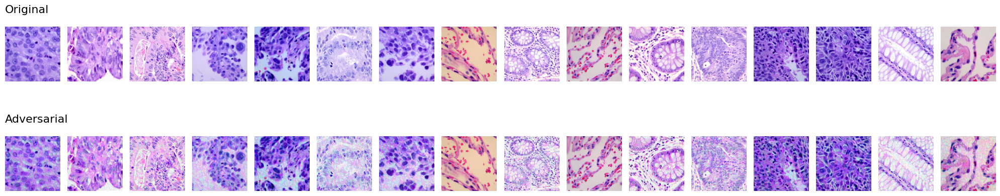

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step
Imagen 1: Predicción original: 4, Predicción adversarial: 3
Imagen 2: Predicción original: 0, Predicción adversarial: 3
Imagen 3: Predicción original: 0, Predicción adversarial: 1
Imagen 4: Predicción original: 2, Predicción adversarial: 3
Imagen 5: Predicción original: 2, Predicción adversarial: 3
Imagen 6: Predicción original: 2, Predicción adversarial: 2
Imagen 7: Predicción original: 2, Predicción adversarial: 3
Imagen 8: Predicción original: 3, Predicción adversarial: 3
Imagen 9: Predicción original: 1, Predicción adversarial: 0
Imagen 10: Predicción original: 3, Predicción adversarial: 3
Imagen 11: Predicción original: 1, Predicción adversarial: 3
Imagen 12: Predicción original: 0, Predicción adversarial: 4
Imagen 13: Predicción original: 4, Predicción adversarial: 2
Imagen 14: Predicción original: 4, Predicción adversarial: 2
Imag

In [39]:
import foolbox as fb
tf.config.list_physical_devices('GPU')
foolboxmodel1 = fb.TensorFlowModel(modelo1_attack,bounds=(0,1))
foolboxmodel2 = fb.TensorFlowModel(modelo2_attack,bounds=(0,1))

# Crear el ataque FGSM
attack = fb.attacks.FGSM()

# Obtener un lote de imágenes del generador
images, labels = next(testing_gen)  # Obtener un batch del generador
# Foolbox espera las etiquetas como números enteros, no como one-hot vectors, así que las convertimos
images = tf.convert_to_tensor(images)

labels = np.argmax(labels, axis=1)
print(labels)
# Realizar el ataque adversarial en el lote de imágenes
adversarial_images = attack(foolboxmodel1, images, labels,epsilons=0.1)
adversarial_images = adversarial_images[0].numpy()
# Mostrar algunas imágenes originales y adversariales para comparación
n_rows = 2  # Número de filas: 1 para originales, 1 para adversariales
n_cols = 16  # Número de columnas para mostrar 16 imágenes en cada fila

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5))
axes[0, 0].set_title('Original', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes originales en la primera fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes originales)
    axes[0, i].imshow(images[i])  # Mostrar la imagen original
    axes[0, i].axis('off')  # Ocultar ejes

axes[1, 0].set_title('Adversarial', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes adversariales en la segunda fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes adversariales)
    axes[1, i].imshow(adversarial_images[i])  # Mostrar la imagen adversarial
    axes[1, i].axis('off')  # Ocultar ejes

# Ajustar el espacio entre los subplots
plt.tight_layout()
plt.show()

# Evaluar si el modelo se ve afectado
predictions = np.argmax(modelo1_attack.predict(adversarial_images), axis=1)
predictions_model2 = np.argmax(modelo2_attack.predict(adversarial_images), axis=1)
original_predictions=np.argmax(modelo1_attack.predict(images),axis=1)
original_predictions2=np.argmax(modelo2_attack.predict(images),axis=1)
##
for i in range(16):
    print(f"Imagen {i+1}: Predicción original: {original_predictions[i]}, "
          f"Predicción adversarial: {predictions[i]}")


En el ejemplo anterior simplemente se muestran las 16 primeras del lote pero calculamos la tasa de acierto para el lote completo


In [40]:
correct_original = 0
correct_adversarial = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions[i] == labels[i]:
        correct_original += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions[i] == labels[i]:
        correct_adversarial += 1

# Calcular la tasa de acierto
accuracy_original = correct_original / total_images * 100
accuracy_adversarial = correct_adversarial / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales: {accuracy_original:.2f}%")
print(f"Tasa de acierto en imágenes adversariales: {accuracy_adversarial:.2f}%")

correct_original2 = 0
correct_adversarial2 = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions2[i] == labels[i]:
        correct_original2 += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions_model2[i] == labels[i]:
        correct_adversarial2 += 1

# Calcular la tasa de acierto
accuracy_original2 = correct_original2 / total_images * 100
accuracy_adversarial2  = correct_adversarial2 / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales para el modelo 2: {accuracy_original2:.2f}%")
print(f"Tasa de acierto en imágenes adversariales para el modelo 2: {accuracy_adversarial2:.2f}%")

Tasa de acierto en imágenes originales: 96.88%
Tasa de acierto en imágenes adversariales: 15.62%
Tasa de acierto en imágenes originales para el modelo 2: 75.00%
Tasa de acierto en imágenes adversariales para el modelo 2: 62.50%


Es interesante ver que el modelo2, usando ResNet50, es mucho menos preciso, pero mucho más robusto. Así que hay que indagar sobre esto para entender el por que y explicarlo.

En general hemos creado un modelo muy preciso, pero muy poco robusto.

El ataque anterior era FGSM, vamos a probar con otro ataque integrado en FoolBox.

[4 0 1 1 2 1 3 1 2 3 2 0 1 0 4 4 4 4 4 4 1 2 2 1 1 2 4 1 0 4 0 2]


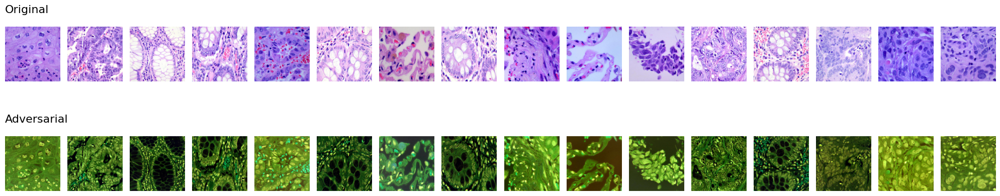

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step
Imagen 1: Predicción original: 4, Predicción adversarial: 3
Imagen 2: Predicción original: 0, Predicción adversarial: 3
Imagen 3: Predicción original: 1, Predicción adversarial: 3
Imagen 4: Predicción original: 1, Predicción adversarial: 3
Imagen 5: Predicción original: 2, Predicción adversarial: 3
Imagen 6: Predicción original: 1, Predicción adversarial: 3
Imagen 7: Predicción original: 3, Predicción adversarial: 3
Imagen 8: Predicción original: 1, Predicción adversarial: 3
Imagen 9: Predicción original: 2, Predicción adversarial: 3
Imagen 10: Predicción original: 3, Predicción adversarial: 3
Imagen 11: Predicción original: 2, Predicción adversarial: 3
Imagen 12: Predicción original: 0, Predicción adversarial: 3
Imagen 13: Predicción original: 1, Predicción adversarial: 3
Imagen 14: Predicción original: 0, Predicción adversarial: 3
Imag

In [68]:
foolboxmodel1 = fb.TensorFlowModel(modelo1_attack,bounds=(0,1))
foolboxmodel2 = fb.TensorFlowModel(modelo2_attack,bounds=(0,1))

distance = fb.distances.l2 # Usar una métrica de distancia, por ejemplo, MeanSquaredDistance
attack = fb.attacks.InversionAttack(distance=distance)

# Obtener un lote de imágenes del generador
images, labels = next(testing_gen)  # Obtener un batch del generador
# Foolbox espera las etiquetas como números enteros, no como one-hot vectors, así que las convertimos
images = tf.convert_to_tensor(images)

labels = np.argmax(labels, axis=1)
print(labels)
epsilons=[0.1]
# Realizar el ataque adversarial en el lote de imágenes
adversarial_images = attack(foolboxmodel1, images, labels,epsilons=epsilons)

adversarial_images = adversarial_images[0][0].numpy()
# Mostrar algunas imágenes originales y adversariales para comparación
n_rows = 2  # Número de filas: 1 para originales, 1 para adversariales
n_cols = 16  # Número de columnas para mostrar 16 imágenes en cada fila

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5))
axes[0, 0].set_title('Original', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes originales en la primera fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes originales)
    axes[0, i].imshow(images[i])  # Mostrar la imagen original
    axes[0, i].axis('off')  # Ocultar ejes

axes[1, 0].set_title('Adversarial', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes adversariales en la segunda fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes adversariales)
    axes[1, i].imshow(adversarial_images[i])  # Mostrar la imagen adversarial
    axes[1, i].axis('off')  # Ocultar ejes

# Ajustar el espacio entre los subplots
plt.tight_layout()
plt.show()

# Evaluar si el modelo se ve afectado
predictions = np.argmax(modelo1_attack.predict(adversarial_images), axis=1)
predictions_model2 = np.argmax(modelo2_attack.predict(adversarial_images), axis=1)
original_predictions=np.argmax(modelo1_attack.predict(images),axis=1)
original_predictions2=np.argmax(modelo2_attack.predict(images),axis=1)
##
for i in range(16):
    print(f"Imagen {i+1}: Predicción original: {original_predictions[i]}, "
          f"Predicción adversarial: {predictions[i]}")


In [69]:
correct_original = 0
correct_adversarial = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions[i] == labels[i]:
        correct_original += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions[i] == labels[i]:
        correct_adversarial += 1

# Calcular la tasa de acierto
accuracy_original = correct_original / total_images * 100
accuracy_adversarial = correct_adversarial / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales: {accuracy_original:.2f}%")
print(f"Tasa de acierto en imágenes adversariales: {accuracy_adversarial:.2f}%")

correct_original2 = 0
correct_adversarial2 = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions2[i] == labels[i]:
        correct_original2 += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions_model2[i] == labels[i]:
        correct_adversarial2 += 1

# Calcular la tasa de acierto
accuracy_original2 = correct_original2 / total_images * 100
accuracy_adversarial2  = correct_adversarial2 / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales para el modelo 2: {accuracy_original2:.2f}%")
print(f"Tasa de acierto en imágenes adversariales para el modelo 2: {accuracy_adversarial2:.2f}%")

Tasa de acierto en imágenes originales: 93.75%
Tasa de acierto en imágenes adversariales: 6.25%
Tasa de acierto en imágenes originales para el modelo 2: 68.75%
Tasa de acierto en imágenes adversariales para el modelo 2: 21.88%


Con los ataques de inversión el resultado se mantiene, Nuestro modelo sigue mostrando una baja robustez, sin embargo, vemos que este ataque ha conseguido alterar notablemente la precisión del modelo de transfer learning, que a pesar de ser menos preciso que nuestro modelo, era bastante robusto contra ataques de gradiente.

Vamos a probar ahora un tercer ataque, introduciendo Ruido Gaussiano.


[2 3 0 3 4 3 2 0 0 3 4 1 0 2 1 0 4 0 2 1 1 3 1 4 0 1 2 4 0 2 1 4]


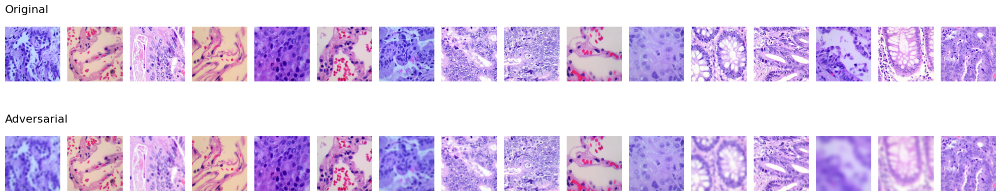

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step
Imagen 1: Predicción original: 2, Predicción adversarial: 4
Imagen 2: Predicción original: 3, Predicción adversarial: 3
Imagen 3: Predicción original: 0, Predicción adversarial: 4
Imagen 4: Predicción original: 3, Predicción adversarial: 3
Imagen 5: Predicción original: 4, Predicción adversarial: 4
Imagen 6: Predicción original: 3, Predicción adversarial: 3
Imagen 7: Predicción original: 2, Predicción adversarial: 4
Imagen 8: Predicción original: 0, Predicción adversarial: 4
Imagen 9: Predicción original: 0, Predicción adversarial: 4
Imagen 10: Predicción original: 3, Predicción adversarial: 3
Imagen 11: Predicción original: 4, Predicción adversarial: 4
Imagen 12: Predicción original: 1, Predicción adversarial: 2
Imagen 13: Predicción original: 0, Predicción adversarial: 4
Imagen 14: Predicción original: 2, Predicción adversarial: 4
I

In [73]:
foolboxmodel1 = fb.TensorFlowModel(modelo1_attack,bounds=(0,1))
foolboxmodel2 = fb.TensorFlowModel(modelo2_attack,bounds=(0,1))

# Crear el ataque GaussianBlur
distance = fb.distances.l2
attack = fb.attacks.GaussianBlurAttack(distance=distance)

# Obtener un lote de imágenes del generador
images, labels = next(testing_gen)  # Obtener un batch del generador
# Foolbox espera las etiquetas como números enteros, no como one-hot vectors, así que las convertimos
images = tf.convert_to_tensor(images)

labels = np.argmax(labels, axis=1)
print(labels)
# Realizar el ataque adversarial en el lote de imágenes
adversarial_images = attack(foolboxmodel1, images, labels,epsilons=0.1)
adversarial_images = adversarial_images[0].numpy()
# Mostrar algunas imágenes originales y adversariales para comparación
n_rows = 2  # Número de filas: 1 para originales, 1 para adversariales
n_cols = 16  # Número de columnas para mostrar 16 imágenes en cada fila

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5))
axes[0, 0].set_title('Original', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes originales en la primera fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes originales)
    axes[0, i].imshow(images[i])  # Mostrar la imagen original
    axes[0, i].axis('off')  # Ocultar ejes

axes[1, 0].set_title('Adversarial', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes adversariales en la segunda fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes adversariales)
    axes[1, i].imshow(adversarial_images[i])  # Mostrar la imagen adversarial
    axes[1, i].axis('off')  # Ocultar ejes

# Ajustar el espacio entre los subplots
plt.tight_layout()
plt.show()

# Evaluar si el modelo se ve afectado
predictions = np.argmax(modelo1_attack.predict(adversarial_images), axis=1)
predictions_model2 = np.argmax(modelo2_attack.predict(adversarial_images), axis=1)
original_predictions=np.argmax(modelo1_attack.predict(images),axis=1)
original_predictions2=np.argmax(modelo2_attack.predict(images),axis=1)
##
for i in range(16):
    print(f"Imagen {i+1}: Predicción original: {original_predictions[i]}, "
          f"Predicción adversarial: {predictions[i]}")


In [74]:
correct_original = 0
correct_adversarial = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions[i] == labels[i]:
        correct_original += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions[i] == labels[i]:
        correct_adversarial += 1

# Calcular la tasa de acierto
accuracy_original = correct_original / total_images * 100
accuracy_adversarial = correct_adversarial / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales: {accuracy_original:.2f}%")
print(f"Tasa de acierto en imágenes adversariales: {accuracy_adversarial:.2f}%")

correct_original2 = 0
correct_adversarial2 = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions2[i] == labels[i]:
        correct_original2 += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions_model2[i] == labels[i]:
        correct_adversarial2 += 1

# Calcular la tasa de acierto
accuracy_original2 = correct_original2 / total_images * 100
accuracy_adversarial2  = correct_adversarial2 / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales para el modelo 2: {accuracy_original2:.2f}%")
print(f"Tasa de acierto en imágenes adversariales para el modelo 2: {accuracy_adversarial2:.2f}%")

Tasa de acierto en imágenes originales: 93.75%
Tasa de acierto en imágenes adversariales: 34.38%
Tasa de acierto en imágenes originales para el modelo 2: 65.62%
Tasa de acierto en imágenes adversariales para el modelo 2: 37.50%


Pablo acuerdate de los articulos que tienes en favoritos ya que te sirven para explicar porque vas a hacer adversarial training con FGSM :)
Y el de data augmentation para aplicar las transformaciones que mas te convienen.


In [27]:
## Vamos a intentar cargar el modelo y reentrenarlo usando Free Adversarial Training
from tensorflow.keras.models import load_model

epsilon = 0.03  # Perturbación adversarial
m = 4  # Número de pasos adversariales en cada batch
epochs = 10
batch_size = 32
learning_rate = 0.001

modelo1_robust = load_model('./modelo1tf.keras')
# Definir el optimizador y la función de pérdida
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
loss_object = tf.keras.losses.CategoricalCrossentropy()

# Crear un modelo de ejemplo (puede ser una CNN para clasificación de imágenes)


# Definir el generador de imágenes


# Free Adversarial Training Step
def adversarial_training_step(model, images, labels, epsilon):
    # Generar perturbaciones adversariales con los gradientes del modelo
    for _ in range(m):
        images=tf.convert_to_tensor(images)
       
        with tf.GradientTape() as tape:
            tape.watch(images)
            predictions = model(images, training=True)
            loss = loss_object(labels, predictions)

        # Calcular gradientes con respecto a las imágenes
        gradients = tape.gradient(loss, images)

        # Generar imágenes adversariales
        adversarial_images = images + epsilon * tf.sign(gradients)
        adversarial_images = tf.clip_by_value(adversarial_images, 0.0, 1.0)  # Limitar entre [0, 1]

        # Usar las imágenes adversariales para entrenar
        with tf.GradientTape() as tape2:
            adversarial_predictions = model(adversarial_images, training=True)
            adversarial_loss = loss_object(labels, adversarial_predictions)
        
        # Actualizar los pesos del modelo
        gradients = tape2.gradient(adversarial_loss, model.trainable_variables)
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    return adversarial_loss

# Entrenamiento con Free Adversarial Training
def train_model_with_free_adversarial_training(model, train_generator, epochs, epsilon):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        total_loss = 0
        steps_per_epoch = train_generator.samples // batch_size

        for step in range(steps_per_epoch):
            images, labels = next(train_generator)
            adversarial_loss = adversarial_training_step(model, images, labels, epsilon)
            total_loss += adversarial_loss

        print(f"Loss after epoch {epoch+1}: {total_loss.numpy() / steps_per_epoch}")

# Crear el modelo y entrenar

train_model_with_free_adversarial_training(modelo1_robust, training_gen, epochs, epsilon)

# Guardar el modelo
modelo1_robust.save('free_adversarial_trained_model.keras')

Epoch 1/10
Loss after epoch 1: 0.6298035562256754
Epoch 2/10
Loss after epoch 2: 0.5495759733430632
Epoch 3/10
Loss after epoch 3: 0.49763483180231227
Epoch 4/10
Loss after epoch 4: 0.4633994748740842
Epoch 5/10
Loss after epoch 5: 0.41885230654761907
Epoch 6/10
Loss after epoch 6: 0.39363570440383183
Epoch 7/10
Loss after epoch 7: 0.37079659486428285
Epoch 8/10
Loss after epoch 8: 0.3424398401281336
Epoch 9/10
Loss after epoch 9: 0.31298006497896635
Epoch 10/10
Loss after epoch 10: 0.2918406336298792


[4 0 2 1 2 0 1 4 0 4 2 2 2 2 0 2 2 1 0 1 2 2 0 4 1 3 2 3 0 4 2 0]


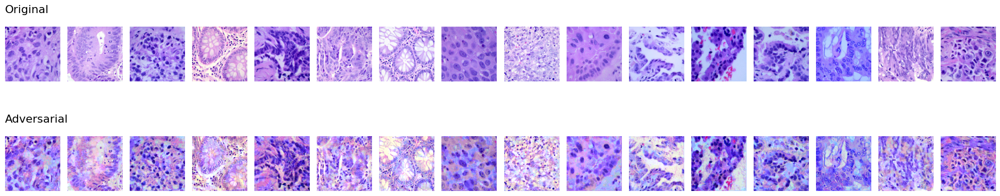

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Imagen 1: Predicción original: 4, Predicción adversarial: 2
Imagen 2: Predicción original: 0, Predicción adversarial: 2
Imagen 3: Predicción original: 2, Predicción adversarial: 4
Imagen 4: Predicción original: 1, Predicción adversarial: 1
Imagen 5: Predicción original: 2, Predicción adversarial: 4
Imagen 6: Predicción original: 0, Predicción adversarial: 1
Imagen 7: Predicción original: 1, Predicción adversarial: 1
Imagen 8: Predicción original: 4, Predicción adversarial: 4
Imagen 9: Predicción original: 0, Predicción adversarial: 1
Imagen 10: Predicción original: 4, Predicción adversarial: 2
Imagen 11: Predicción original: 2, Predicción adversarial: 0
Imagen 12: Predicción original: 2, Predicción adversarial: 2
Imagen 13: Predicción original: 2, Predicción adversarial: 2
Imagen 14: Predicción original: 2, Predicción adversarial: 2
Imagen 15: Predicción original: 0, Predicción adversarial: 2
Imagen 16: Predicc

In [30]:
import foolbox as fb
tf.config.list_physical_devices('GPU')
foolboxmodel1 = fb.TensorFlowModel(modelo1_robust,bounds=(0,1))

# Crear el ataque FGSM
attack = fb.attacks.FGSM()

# Obtener un lote de imágenes del generador
images, labels = next(testing_gen)  # Obtener un batch del generador
# Foolbox espera las etiquetas como números enteros, no como one-hot vectors, así que las convertimos
images = tf.convert_to_tensor(images)

labels = np.argmax(labels, axis=1)
print(labels)
# Realizar el ataque adversarial en el lote de imágenes
adversarial_images = attack(foolboxmodel1, images, labels,epsilons=0.1)
adversarial_images = adversarial_images[0].numpy()
# Mostrar algunas imágenes originales y adversariales para comparación
n_rows = 2  # Número de filas: 1 para originales, 1 para adversariales
n_cols = 16  # Número de columnas para mostrar 16 imágenes en cada fila

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5))
axes[0, 0].set_title('Original', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes originales en la primera fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes originales)
    axes[0, i].imshow(images[i])  # Mostrar la imagen original
    axes[0, i].axis('off')  # Ocultar ejes

axes[1, 0].set_title('Adversarial', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes adversariales en la segunda fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes adversariales)
    axes[1, i].imshow(adversarial_images[i])  # Mostrar la imagen adversarial
    axes[1, i].axis('off')  # Ocultar ejes

# Ajustar el espacio entre los subplots
plt.tight_layout()
plt.show()

# Evaluar si el modelo se ve afectado
predictions = np.argmax(modelo1_robust.predict(adversarial_images), axis=1)

original_predictions=np.argmax(modelo1_robust.predict(images),axis=1)

##
for i in range(16):
    print(f"Imagen {i+1}: Predicción original: {original_predictions[i]}, "
          f"Predicción adversarial: {predictions[i]}")


In [32]:
correct_original = 0
correct_adversarial = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions[i] == labels[i]:
        correct_original += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions[i] == labels[i]:
        correct_adversarial += 1

# Calcular la tasa de acierto
accuracy_original = correct_original / total_images * 100
accuracy_adversarial = correct_adversarial / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales: {accuracy_original:.2f}%")
print(f"Tasa de acierto en imágenes adversariales: {accuracy_adversarial:.2f}%")


Tasa de acierto en imágenes originales: 93.75%
Tasa de acierto en imágenes adversariales: 40.62%


[4 4 0 4 1 3 1 4 3 0 0 1 3 2 1 1 0 1 2 0 2 3 3 4 1 4 4 2 0 3 1 2]


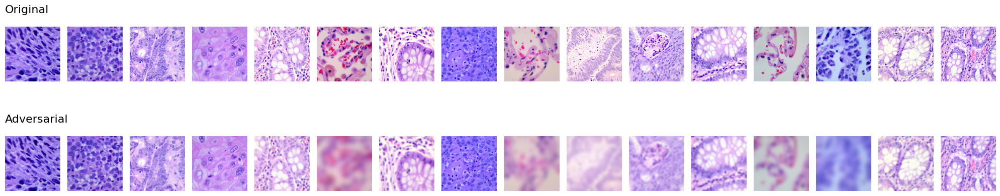

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Imagen 1: Predicción original: 4, Predicción adversarial: 4
Imagen 2: Predicción original: 4, Predicción adversarial: 4
Imagen 3: Predicción original: 0, Predicción adversarial: 2
Imagen 4: Predicción original: 4, Predicción adversarial: 4
Imagen 5: Predicción original: 1, Predicción adversarial: 0
Imagen 6: Predicción original: 3, Predicción adversarial: 1
Imagen 7: Predicción original: 1, Predicción adversarial: 0
Imagen 8: Predicción original: 4, Predicción adversarial: 4
Imagen 9: Predicción original: 3, Predicción adversarial: 0
Imagen 10: Predicción original: 0, Predicción adversarial: 3
Imagen 11: Predicción original: 0, Predicción adversarial: 2
Imagen 12: Predicción original: 1, Predicción adversarial: 0
Imagen 13: Predicción original: 3, Predicción adversarial: 2
Imagen 14: Predicción original: 2, Predicción adversarial: 4
Imagen 15: Predicción original: 1, Predicción adversarial: 0
Imagen 16: Predicc

In [33]:
foolboxmodel1 = fb.TensorFlowModel(modelo1_robust,bounds=(0,1))


# Crear el ataque GaussianBlur
distance = fb.distances.l2
attack = fb.attacks.GaussianBlurAttack(distance=distance)

# Obtener un lote de imágenes del generador
images, labels = next(testing_gen)  # Obtener un batch del generador
# Foolbox espera las etiquetas como números enteros, no como one-hot vectors, así que las convertimos
images = tf.convert_to_tensor(images)

labels = np.argmax(labels, axis=1)
print(labels)
# Realizar el ataque adversarial en el lote de imágenes
adversarial_images = attack(foolboxmodel1, images, labels,epsilons=0.1)
adversarial_images = adversarial_images[0].numpy()
# Mostrar algunas imágenes originales y adversariales para comparación
n_rows = 2  # Número de filas: 1 para originales, 1 para adversariales
n_cols = 16  # Número de columnas para mostrar 16 imágenes en cada fila

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5))
axes[0, 0].set_title('Original', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes originales en la primera fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes originales)
    axes[0, i].imshow(images[i])  # Mostrar la imagen original
    axes[0, i].axis('off')  # Ocultar ejes

axes[1, 0].set_title('Adversarial', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes adversariales en la segunda fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes adversariales)
    axes[1, i].imshow(adversarial_images[i])  # Mostrar la imagen adversarial
    axes[1, i].axis('off')  # Ocultar ejes

# Ajustar el espacio entre los subplots
plt.tight_layout()
plt.show()

# Evaluar si el modelo se ve afectado
predictions = np.argmax(modelo1_robust.predict(adversarial_images), axis=1)
original_predictions=np.argmax(modelo1_robust.predict(images),axis=1)

for i in range(16):
    print(f"Imagen {i+1}: Predicción original: {original_predictions[i]}, "
          f"Predicción adversarial: {predictions[i]}")

In [34]:
correct_original = 0
correct_adversarial = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions[i] == labels[i]:
        correct_original += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions[i] == labels[i]:
        correct_adversarial += 1

# Calcular la tasa de acierto
accuracy_original = correct_original / total_images * 100
accuracy_adversarial = correct_adversarial / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales: {accuracy_original:.2f}%")
print(f"Tasa de acierto en imágenes adversariales: {accuracy_adversarial:.2f}%")

Tasa de acierto en imágenes originales: 93.75%
Tasa de acierto en imágenes adversariales: 21.88%


In [10]:
## Vamos a intentar cargar el modelo2 de transfer learning y reentrenarlo usando Free Adversarial Training
from tensorflow.keras.models import load_model

epsilon = 0.03  # Perturbación adversarial
m = 4  # Número de pasos adversariales en cada batch
epochs = 10
batch_size = 32
learning_rate = 0.001

modelo2_robust = load_model('./modelo2tf.keras')
# Definir el optimizador y la función de pérdida
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
loss_object = tf.keras.losses.CategoricalCrossentropy()

# Crear un modelo de ejemplo (puede ser una CNN para clasificación de imágenes)


# Definir el generador de imágenes


# Free Adversarial Training Step
def adversarial_training_step(model, images, labels, epsilon):
    # Generar perturbaciones adversariales con los gradientes del modelo
    for _ in range(m):
        images=tf.convert_to_tensor(images)
       
        with tf.GradientTape() as tape:
            tape.watch(images)
            predictions = model(images, training=True)
            loss = loss_object(labels, predictions)

        # Calcular gradientes con respecto a las imágenes
        gradients = tape.gradient(loss, images)

        # Generar imágenes adversariales
        adversarial_images = images + epsilon * tf.sign(gradients)
        adversarial_images = tf.clip_by_value(adversarial_images, 0.0, 1.0)  # Limitar entre [0, 1]

        # Usar las imágenes adversariales para entrenar
        with tf.GradientTape() as tape2:
            adversarial_predictions = model(adversarial_images, training=True)
            adversarial_loss = loss_object(labels, adversarial_predictions)
        
        # Actualizar los pesos del modelo
        gradients = tape2.gradient(adversarial_loss, model.trainable_variables)
        optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    return adversarial_loss

# Entrenamiento con Free Adversarial Training
def train_model_with_free_adversarial_training(model, train_generator, epochs, epsilon):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        total_loss = 0
        steps_per_epoch = train_generator.samples // batch_size

        for step in range(steps_per_epoch):
            images, labels = next(train_generator)
            adversarial_loss = adversarial_training_step(model, images, labels, epsilon)
            total_loss += adversarial_loss

        print(f"Loss after epoch {epoch+1}: {total_loss.numpy() / steps_per_epoch}")

# Crear el modelo y entrenar 

train_model_with_free_adversarial_training(modelo2_robust, training_gen, epochs, epsilon)

# Guardar el modelo
modelo2_robust.save('free_adversarial_trained_model2.keras')

c:\Users\Pablo\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\saving\saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 6 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
Loss after epoch 1: 1.6208698426410828
Epoch 2/10
Loss after epoch 2: 1.5965999840816736
Epoch 3/10
Loss after epoch 3: 1.5931113665793841
Epoch 4/10
Loss after epoch 4: 1.5904178828983517
Epoch 5/10
Loss after epoch 5: 1.6004823118775755
Epoch 6/10
Loss after epoch 6: 1.5935213976290636
Epoch 7/10
Loss after epoch 7: 1.5885483738266941
Epoch 8/10
Loss after epoch 8: 1.589278783553686
Epoch 9/10
Loss after epoch 9: 1.5957828284183264
Epoch 10/10
Loss after epoch 10: 1.5964595808650985


[2 2 2 0 4 3 3 4 1 3 0 3 4 1 0 0 1 2 4 4 1 1 0 1 2 2 0 3 0 0 1 2]


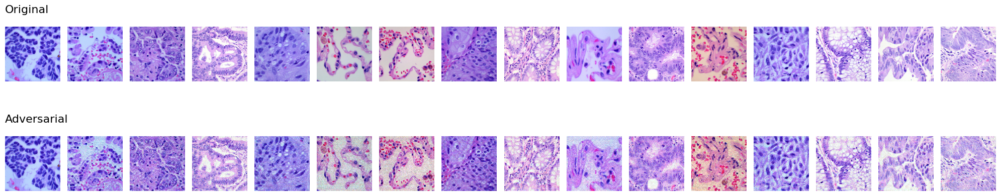

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 865ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step
Imagen 1: Predicción original: 3, Predicción adversarial: 3
Imagen 2: Predicción original: 1, Predicción adversarial: 0
Imagen 3: Predicción original: 0, Predicción adversarial: 0
Imagen 4: Predicción original: 0, Predicción adversarial: 0
Imagen 5: Predicción original: 3, Predicción adversarial: 1
Imagen 6: Predicción original: 3, Predicción adversarial: 0
Imagen 7: Predicción original: 3, Predicción adversarial: 0
Imagen 8: Predicción original: 3, Predicción adversarial: 0
Imagen 9: Predicción original: 1, Predicción adversarial: 1
Imagen 10: Predicción original: 3, Predicción adversarial: 0
Imagen 11: Predicción original: 0, Predicción adversarial: 0
Imagen 12: Predicción original: 3, Predicción adversarial: 0
Imagen 13: Predicción original: 3, Predicción adversarial: 3
Imagen 14: Predicción original: 1, Predicción adversarial: 1
Imagen 15: Predicción original: 1, Predicción adversarial: 1
Imagen 16: Predi

In [19]:
import foolbox as fb
tf.config.list_physical_devices('GPU')
foolboxmodel2 = fb.TensorFlowModel(modelo2_robust,bounds=(0,1))

# Crear el ataque FGSM
attack = fb.attacks.FGSM()

# Obtener un lote de imágenes del generador
images, labels = next(testing_gen)  # Obtener un batch del generador
# Foolbox espera las etiquetas como números enteros, no como one-hot vectors, así que las convertimos
images = tf.convert_to_tensor(images)

labels = np.argmax(labels, axis=1)
print(labels)
# Realizar el ataque adversarial en el lote de imágenes
adversarial_images = attack(foolboxmodel2, images, labels,epsilons=0.1)
adversarial_images = adversarial_images[0].numpy()
# Mostrar algunas imágenes originales y adversariales para comparación
n_rows = 2  # Número de filas: 1 para originales, 1 para adversariales
n_cols = 16  # Número de columnas para mostrar 16 imágenes en cada fila

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5))
axes[0, 0].set_title('Original', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes originales en la primera fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes originales)
    axes[0, i].imshow(images[i])  # Mostrar la imagen original
    axes[0, i].axis('off')  # Ocultar ejes

axes[1, 0].set_title('Adversarial', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes adversariales en la segunda fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes adversariales)
    axes[1, i].imshow(adversarial_images[i])  # Mostrar la imagen adversarial
    axes[1, i].axis('off')  # Ocultar ejes

# Ajustar el espacio entre los subplots
plt.tight_layout()
plt.show()

# Evaluar si el modelo se ve afectado
predictions = np.argmax(modelo2_robust.predict(adversarial_images), axis=1)

original_predictions=np.argmax(modelo2_robust.predict(images),axis=1)

##
for i in range(16):
    print(f"Imagen {i+1}: Predicción original: {original_predictions[i]}, "
          f"Predicción adversarial: {predictions[i]}")

In [20]:
correct_original = 0
correct_adversarial = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions[i] == labels[i]:
        correct_original += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions[i] == labels[i]:
        correct_adversarial += 1

# Calcular la tasa de acierto
accuracy_original = correct_original / total_images * 100
accuracy_adversarial = correct_adversarial / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales: {accuracy_original:.2f}%")
print(f"Tasa de acierto en imágenes adversariales: {accuracy_adversarial:.2f}%")

Tasa de acierto en imágenes originales: 50.00%
Tasa de acierto en imágenes adversariales: 21.88%


[3 4 4 0 3 4 4 0 2 0 4 4 3 2 1 1 0 0 4 1 2 4 3 2 3 3 2 2 1 3 4 2]


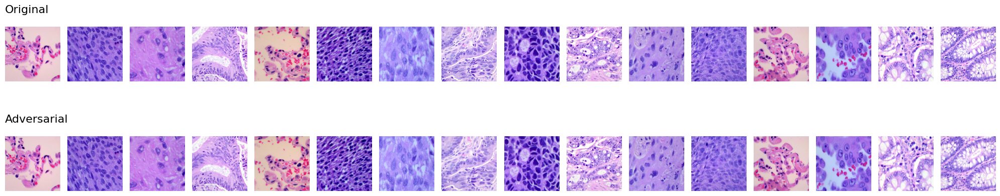

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step
Imagen 1: Predicción original: 3, Predicción adversarial: 3
Imagen 2: Predicción original: 3, Predicción adversarial: 3
Imagen 3: Predicción original: 3, Predicción adversarial: 3
Imagen 4: Predicción original: 0, Predicción adversarial: 4
Imagen 5: Predicción original: 3, Predicción adversarial: 3
Imagen 6: Predicción original: 1, Predicción adversarial: 1
Imagen 7: Predicción original: 3, Predicción adversarial: 3
Imagen 8: Predicción original: 0, Predicción adversarial: 3
Imagen 9: Predicción original: 3, Predicción adversarial: 3
Imagen 10: Predicción original: 1, Predicción adversarial: 1
Imagen 11: Predicción original: 3, Predicción adversarial: 3
Imagen 12: Predicción original: 4, Predicción adversarial: 3
Imagen 13: Predicción original: 3, Predicción adversarial: 3
Imagen 14: Predicción original: 3, Predicción adversarial: 3
Imagen 15: Predicción original: 1, Predicción adversarial: 3
Imagen 16: Predi

In [21]:
foolboxmodel2 = fb.TensorFlowModel(modelo2_robust,bounds=(0,1))


# Crear el ataque GaussianBlur
distance = fb.distances.l2
attack = fb.attacks.GaussianBlurAttack(distance=distance)

# Obtener un lote de imágenes del generador
images, labels = next(testing_gen)  # Obtener un batch del generador
# Foolbox espera las etiquetas como números enteros, no como one-hot vectors, así que las convertimos
images = tf.convert_to_tensor(images)

labels = np.argmax(labels, axis=1)
print(labels)
# Realizar el ataque adversarial en el lote de imágenes
adversarial_images = attack(foolboxmodel2, images, labels,epsilons=0.1)
adversarial_images = adversarial_images[0].numpy()
# Mostrar algunas imágenes originales y adversariales para comparación
n_rows = 2  # Número de filas: 1 para originales, 1 para adversariales
n_cols = 16  # Número de columnas para mostrar 16 imágenes en cada fila

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5))
axes[0, 0].set_title('Original', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes originales en la primera fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes originales)
    axes[0, i].imshow(images[i])  # Mostrar la imagen original
    axes[0, i].axis('off')  # Ocultar ejes

axes[1, 0].set_title('Adversarial', fontsize=16, loc='left', pad=20)
# Mostrar las imágenes adversariales en la segunda fila
for i in range(n_cols):  # Iteramos sobre las 16 columnas (imagenes adversariales)
    axes[1, i].imshow(adversarial_images[i])  # Mostrar la imagen adversarial
    axes[1, i].axis('off')  # Ocultar ejes

# Ajustar el espacio entre los subplots
plt.tight_layout()
plt.show()

# Evaluar si el modelo se ve afectado
predictions = np.argmax(modelo2_robust.predict(adversarial_images), axis=1)
original_predictions=np.argmax(modelo2_robust.predict(images),axis=1)

for i in range(16):
    print(f"Imagen {i+1}: Predicción original: {original_predictions[i]}, "
          f"Predicción adversarial: {predictions[i]}")

In [22]:
correct_original = 0
correct_adversarial = 0
total_images = len(labels)  # Total de imágenes (16 en este caso)

# Calcular los aciertos
for i in range(total_images):
    # Verificar si la predicción original es correcta
    if original_predictions[i] == labels[i]:
        correct_original += 1
    
    # Verificar si la predicción adversarial es correcta
    if predictions[i] == labels[i]:
        correct_adversarial += 1

# Calcular la tasa de acierto
accuracy_original = correct_original / total_images * 100
accuracy_adversarial = correct_adversarial / total_images * 100

# Imprimir las tasas de acierto
print(f"Tasa de acierto en imágenes originales: {accuracy_original:.2f}%")
print(f"Tasa de acierto en imágenes adversariales: {accuracy_adversarial:.2f}%")

Tasa de acierto en imágenes originales: 50.00%
Tasa de acierto en imágenes adversariales: 21.88%
